<a href="https://colab.research.google.com/github/sagarika4/Image-Classification-STL10/blob/master/transfer_learning_STL10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!rm -rf Image-Classification-STL10/

In [2]:
#Clone the repo to access utlity files and trained model parameters
!git clone https://github.com/sagarika4/Image-Classification-STL10.git

Cloning into 'Image-Classification-STL10'...
remote: Enumerating objects: 6, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 49 (delta 2), reused 4 (delta 2), pack-reused 43
Unpacking objects: 100% (49/49), done.


In [3]:
source_path = '/content/Image-Classification-STL10'
import sys
sys.path.insert(0, source_path)

In [4]:
from transfer_learning_utils import *
from visualisation_utils import *

In [5]:
# Initialise the device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

**Load the data**

In [6]:
dataloaders = load_dataset(root_path = "{}/stl10".format(source_path), 
                           batch_size = 256, num_workers = 2, cutout_transformation =  True, cutout_transformation_length = 80)
class_names = dataloaders['train'].dataset.classes


Extracting /content/Image-Classification-STL10/stl10/stl10_binary.tar.gz to /content/Image-Classification-STL10/stl10



**Visualise a batch of training data**

<Figure size 7200x7200 with 0 Axes>

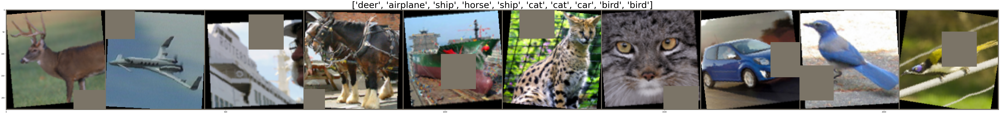

In [7]:
# Get a batch of training data
inputs, labels = next(iter(dataloaders['train']))
# Make a grid from batch
plt.figure(figsize=[100, 100]) 
#Visualise first 10 images from the batch
out = torchvision.utils.make_grid(inputs[0:10], nrow=10, scale_each=True)
show_images_grid(out, title = [class_names[x] for x in labels[0:10]], fontsize = 50)

**Train model by Fine Tuning the ConvNet**

*Skip these steps if you want to use model trained in previous sessions and directly load the fine tuned parameter weights onto pretrained resnet18*

Find the most optimal learning rate

In [8]:
!pip install torch-lr-finder 

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


Stopping early, the loss has diverged
Learning rate search finished. See the graph with {finder_name}.plot()
LR suggestion: steepest gradient
Suggested LR: 8.30E-03


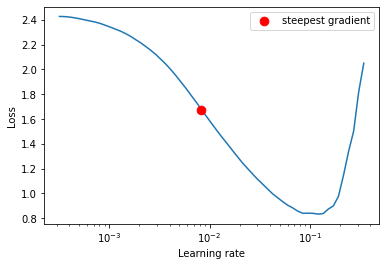

In [9]:
from torch_lr_finder import LRFinder

#Load the pretrained the resnet18
model_ft = models.resnet18(pretrained=True)

num_ftrs = model_ft.fc.in_features
#Add the fully connected layer
model_ft.fc = nn.Linear(num_ftrs, len(class_names))

#Softmax activation for classification
criterion = nn.CrossEntropyLoss()

optimizer_ft = optim.SGD(model_ft.parameters(), lr=1e-4, momentum=0.9)
lr_finder = LRFinder(model_ft, optimizer_ft, criterion, device=device)
lr_finder.range_test(dataloaders['train'], end_lr=10, num_iter=100)
lr_finder.plot() # to inspect the loss-learning rate graph

lr_finder.reset() 

In [10]:
model_ft = model_ft.to(device)
#Use the learning rate obtained from above
optimizer_ft = optim.SGD(model_ft.parameters(), lr=8.30E-03, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

In [11]:
#Fine Tuned model
#Skip training process if want to directly load model weights already trained in previous sessions
num_epochs = 20
model_ft, train_accuracy, validation_accuracy = train_model(device, dataloaders, model_ft, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=num_epochs)

Epoch 0/19
----------
train Loss: 1.3023 Acc: 0.5850

Epoch 0/19
----------
val Loss: 0.3742 Acc: 0.8938

Epoch 5/19
----------
train Loss: 0.1002 Acc: 0.9682

Epoch 5/19
----------
val Loss: 0.1392 Acc: 0.9513

Epoch 10/19
----------
train Loss: 0.0587 Acc: 0.9836

Epoch 10/19
----------
val Loss: 0.1200 Acc: 0.9581

Epoch 15/19
----------
train Loss: 0.0578 Acc: 0.9842

Epoch 15/19
----------
val Loss: 0.1185 Acc: 0.9578

Training complete in 8m 31s
Best val Acc: 95.937500


Visualise training and validation accuracy with respect to number of epochs

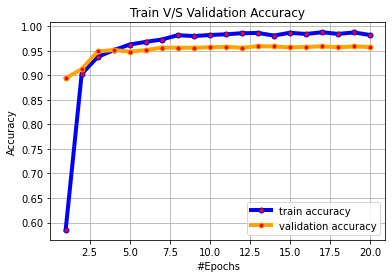

In [12]:
# Plot the accuracies against the number of epochs
plot_accuracies(num_epochs, train_accuracy, validation_accuracy)

Save the model weights if satisfied

In [14]:
torch.save(model_ft.state_dict(), '{}/net_params_ft1.pth'.format(source_path))

**Test the trained model**

Run this if want to use model trained in previous sessions by loading the pre-trained parameters

In [7]:
model_ft = models.resnet18(pretrained=True)
num_ftrs = model_ft.fc.in_features
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft.fc = nn.Linear(num_ftrs, len(class_names))

model_ft = model_ft.to(device)
model_ft.load_state_dict(torch.load('{}/net_params_ft.pth'.format(source_path)))

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


<All keys matched successfully>

In [13]:
test_accuracy, incorrect_images, pred_classes_incorrect, pred_classes_correct = test(device, dataloaders, model_ft)
print('Accuracy of the network on {} test images: {}%'.format(len(dataloaders['test'].sampler), round(test_accuracy.item()*100.0/len(dataloaders['test']), 2)))

Accuracy of the network on 4800 test images: 96.15%


***Visualise Images with Labels classified incorrectly***





<Figure size 7200x7200 with 0 Axes>

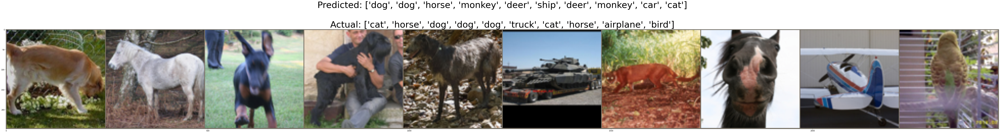

In [15]:
incorrect_images_visualise, pred_classes_incorrect_display, pred_classes_correct_display = prepare_and_get_misclassified_images_data(incorrect_images, pred_classes_incorrect, pred_classes_correct)
visualise_images_misclassified(incorrect_images_visualise[0:10], pred_classes_incorrect_display[0:10], pred_classes_correct_display[0:10], class_names)

<Figure size 7200x7200 with 0 Axes>

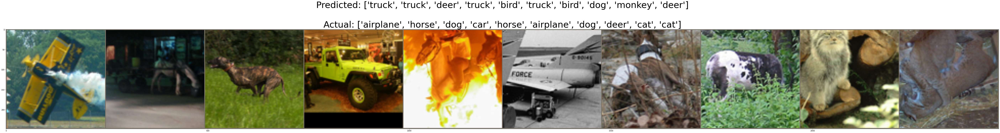

In [22]:
visualise_images_misclassified(incorrect_images_visualise[10:20], pred_classes_incorrect_display[10:20], pred_classes_correct_display[10:20], class_names)

**Visualise Class Activation Mappings for misclassified images**

In [16]:
feature_conv, class_idx_incorrect, class_idx_correct, weight_softmax = get_CAM_inputs(model_ft, incorrect_images_visualise, pred_classes_correct_display)

Visualise activation mappings leading to misclassification

In [17]:
overlay_incorrect_classes = get_CAM(feature_conv, weight_softmax, class_idx_incorrect)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'Predicted: truck\nActual: airplane')

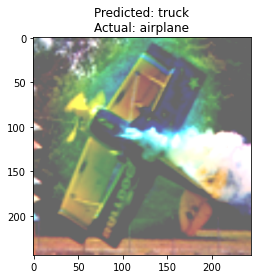

In [25]:
i = 10 # image number to be viewed from the above grid
superimposed_image = get_CAM_on_image(incorrect_images_visualise[i], overlay_incorrect_classes[i])
plt.imshow(superimposed_image, alpha = 0.6)
plt.title("Predicted: " + str(class_names[class_idx_incorrect[i][0]]) + "\nActual: " + str(class_names[class_idx_correct[i][0]]))

**Train using Fixed Feature Extraction**

---


Find the most optimal Learning Rate

Stopping early, the loss has diverged
Learning rate search finished. See the graph with {finder_name}.plot()
LR suggestion: steepest gradient
Suggested LR: 1.18E-02


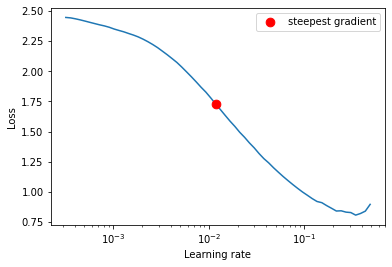

In [21]:
from torch_lr_finder import LRFinder

model_conv = torchvision.models.resnet18(pretrained=True)
for param in model_conv.parameters():
    param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, len(class_names))

model_conv = model_conv.to(device)

criterion = nn.CrossEntropyLoss()

optimizer_conv = optim.SGD(model_conv.parameters(), lr=1e-4, momentum=0.9)
lr_finder = LRFinder(model_conv, optimizer_conv, criterion, device=device)
lr_finder.range_test(dataloaders['train'], end_lr=10, num_iter=100)
lr_finder.plot() # to inspect the loss-learning rate graph

lr_finder.reset() 

In [27]:
# only parameters of final layer are being optimized as
# opposed to before.
optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=1.18E-02, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

In [28]:
num_epochs = 20
model_conv, train_accuracy, validation_accuracy = train_model(device, dataloaders, model_conv, criterion, optimizer_conv, exp_lr_scheduler, num_epochs = num_epochs)

Epoch 0/19
----------
train Loss: 1.4218 Acc: 0.5620

Epoch 0/19
----------
val Loss: 0.5089 Acc: 0.8862

Epoch 5/19
----------
train Loss: 0.3744 Acc: 0.8782

Epoch 5/19
----------
val Loss: 0.2685 Acc: 0.9175

Epoch 10/19
----------
train Loss: 0.3491 Acc: 0.8840

Epoch 10/19
----------
val Loss: 0.2535 Acc: 0.9206

Epoch 15/19
----------
train Loss: 0.3435 Acc: 0.8896

Epoch 15/19
----------
val Loss: 0.2561 Acc: 0.9209

Training complete in 8m 51s
Best val Acc: 92.343750


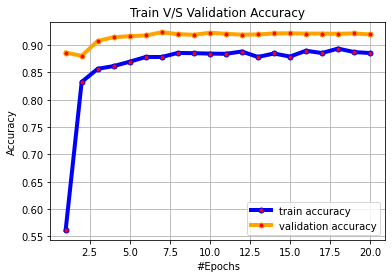

In [29]:
plot_accuracies(num_epochs, train_accuracy, validation_accuracy)

In [ ]:
torch.save(model_conv.state_dict(), '{}/net_params_conv.pth'.format(source_path))

**Test the trained model**

Run this to load paramter weights of pre-trained model on STL10

In [ ]:
model_conv = models.resnet18(pretrained=True)
num_ftrs = model_conv.fc.in_features
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_conv.fc = nn.Linear(num_ftrs, len(class_names))

model_conv = model_conv.to(device)
model_conv.load_state_dict(torch.load('{}/net_params_conv.pth'.format(source_path)))
model_conv.eval()

In [30]:
test_accuracy, incorrect_images, pred_classes_incorrect, pred_classes_correct = test(device, dataloaders, model_conv)
print('Accuracy of the network on {} test images: {}%'.format(len(dataloaders['test'].sampler), round(test_accuracy.item()*100.0/len(dataloaders['test']), 2)))

Accuracy of the network on 4800 test images: 92.93%


***Visualise Images with Labels classified incorrectly***

<Figure size 7200x7200 with 0 Axes>

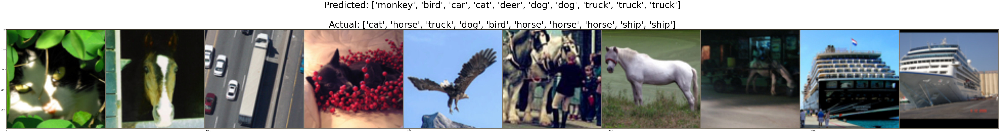

In [31]:
incorrect_images_visualise, pred_classes_incorrect_display, pred_classes_correct_display = prepare_and_get_misclassified_images_data(incorrect_images, pred_classes_incorrect, pred_classes_correct)
visualise_images_misclassified(incorrect_images_visualise[0:10], pred_classes_incorrect_display[0:10], pred_classes_correct_display[0:10], class_names)

In [32]:
feature_conv, class_idx_incorrect, class_idx_correct, weight_softmax = get_CAM_inputs(model_conv, incorrect_images_visualise, pred_classes_correct_display)

In [33]:
overlay_incorrect_classes = get_CAM(feature_conv, weight_softmax, class_idx_incorrect)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'Predicted: bird\nActual: horse')

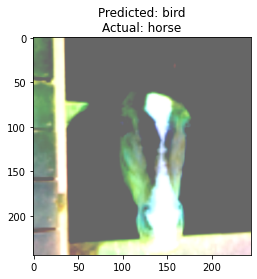

In [34]:
i = 1 # image number to be viewed from the above grid
superimposed_image = get_CAM_on_image(incorrect_images_visualise[i], overlay_incorrect_classes[i])
plt.imshow(superimposed_image, alpha = 0.6)
plt.title("Predicted: " + str(class_names[class_idx_incorrect[i][0]]) + "\nActual: " + str(class_names[class_idx_correct[i][0]]))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'Predicted: deer\nActual: bird')

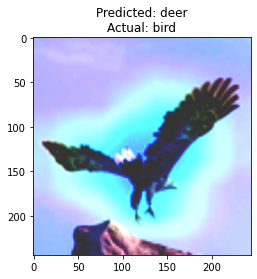

In [35]:
i = 4 # image number to be viewed from the above grid
superimposed_image = get_CAM_on_image(incorrect_images_visualise[i], overlay_incorrect_classes[i])
plt.imshow(superimposed_image, alpha = 0.8)
plt.title("Predicted: " + str(class_names[class_idx_incorrect[i][0]]) + "\nActual: " + str(class_names[class_idx_correct[i][0]]))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'Predicted: car\nActual: airplane')

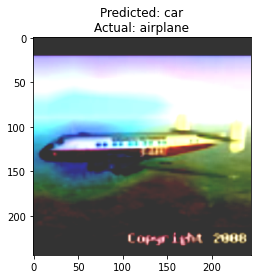

In [ ]:
i = 12 # image number to be viewed from the above grid
superimposed_image = get_CAM_on_image(incorrect_images_visualise[i], overlay_incorrect_classes[i])
plt.imshow(superimposed_image, alpha = 0.8)
plt.title("Predicted: " + str(class_names[class_idx_incorrect[i][0]]) + "\nActual: " + str(class_names[class_idx_correct[i][0]]))